In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pydicom

import cv2
import skimage

In [3]:
parrot = plt.imread("image/parrot.png")
lung = plt.imread("image/lung.tif")
cameraman = plt.imread("image/cameraman.tif")
dolar = plt.imread("image/dollar100.tif")
flower = plt.imread("image/flowers_1.jpg")

# I) Convert to Grayscale

In [4]:
def Grayscale_Lightness(img):
    R = np.array(img[:,:,0], dtype=np.float32)
    G = np.array(img[:,:,1], dtype=np.float32)
    B = np.array(img[:,:,2], dtype=np.float32)
    height, width = R.shape
    output = np.zeros([height, width], dtype=np.float32)
    for x in range(height):
        for y in range(width):
            min_value = np.min((R[x, y], G[x, y], B[x, y]))
            max_value = np.max((R[x, y], G[x, y], B[x, y]))
            output[x, y] = (min_value + max_value) / 2
    return output

def Grayscale_Average(img):
    R = np.array(img[:,:,0], dtype=np.float32)
    G = np.array(img[:,:,1], dtype=np.float32)
    B = np.array(img[:,:,2], dtype=np.float32)
    output = (R + G + B) / 3
    return output

def Grayscale_Luminosity(img):
    R = np.array(img[:,:,0], dtype=np.float32)
    G = np.array(img[:,:,1], dtype=np.float32)
    B = np.array(img[:,:,2], dtype=np.float32)
    output = 0.3*R + 0.59*G + 0.11*B
    return output

In [5]:
parrot_grayscale_lightness = Grayscale_Lightness(parrot)
parrot_grayscale_avegare = Grayscale_Average(parrot)
parrot_grayscale_luminosity = Grayscale_Luminosity(parrot)
parrot_grayscale_cv2 = cv2.cvtColor(parrot, cv2.COLOR_RGB2GRAY)
parrot_grayscale_skimage = skimage.color.rgb2gray(parrot)

Text(0.5, 1.0, 'Luminosity Method')

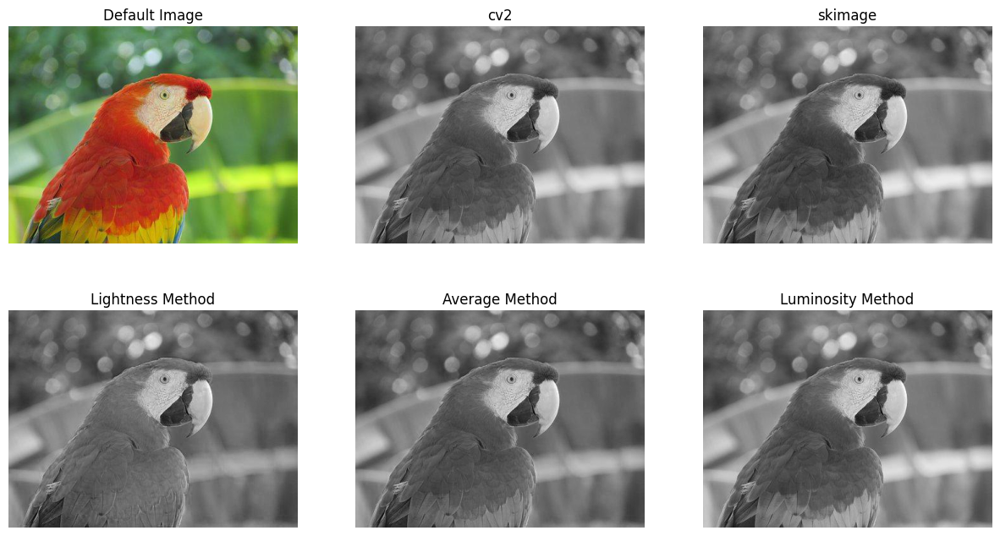

In [6]:
plt.figure(figsize=(15,8))

plt.subplot(231)
plt.imshow(parrot)
plt.axis('off')
plt.title("Default Image")

plt.subplot(232)
plt.imshow(parrot_grayscale_cv2, cmap='gray')
plt.axis('off')
plt.title("cv2")

plt.subplot(233)
plt.imshow(parrot_grayscale_skimage, cmap='gray')
plt.axis('off')
plt.title("skimage")

plt.subplot(234)
plt.imshow(parrot_grayscale_lightness, cmap='gray')
plt.axis('off')
plt.title("Lightness Method")

plt.subplot(235)
plt.imshow(parrot_grayscale_avegare, cmap='gray')
plt.axis('off')
plt.title("Average Method")

plt.subplot(236)
plt.imshow(parrot_grayscale_luminosity, cmap='gray')
plt.axis('off')
plt.title("Luminosity Method")

# II) Black and White Image

In [7]:
def Black_White(img):
    dim = img.ndim
    height, width = img.shape[0], img.shape[1]
    temp_matrix = np.ones([height, width])
    if dim == 3:
        # Convert to grayscale Average method
        R = np.array(img[:,:,0].astype(np.float32))
        G = np.array(img[:,:,1].astype(np.float32))
        B = np.array(img[:,:,2].astype(np.float32))
        grayscale = (R+G+B)/3
        temp_matrix = grayscale
    if dim == 2:
        temp_matrix = img
    output = (temp_matrix / np.max(img)).round().astype(np.int32)
    return output
    

(-0.5, 1251.5, 975.5, -0.5)

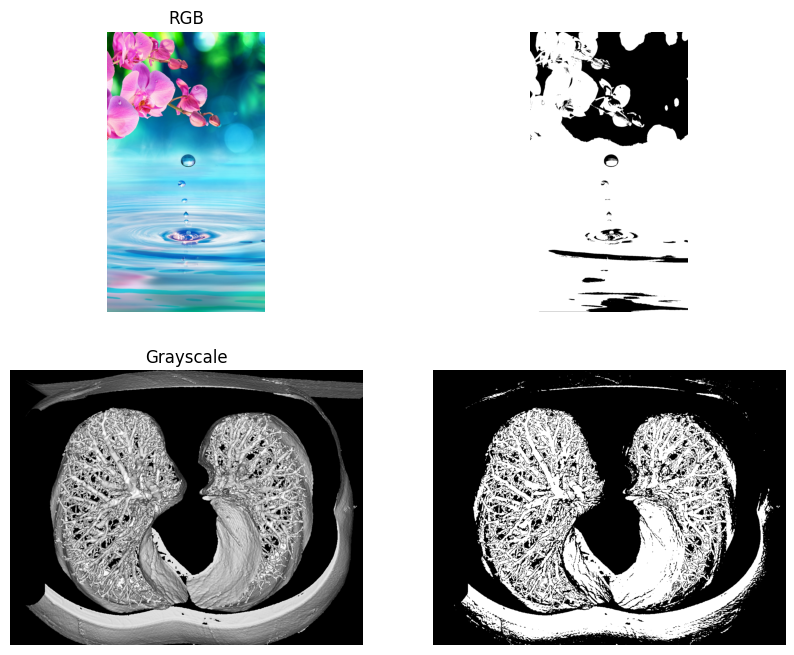

In [8]:
plt.figure(figsize=(10,8))

plt.subplot(221)
plt.imshow(flower, cmap='gray')
plt.title("RGB")
plt.axis('off')
plt.subplot(222)
flower_bw = Black_White(flower)
plt.imshow(flower_bw, cmap='gray')
plt.axis('off')

plt.subplot(223)
plt.imshow(lung, cmap='gray')
plt.title("Grayscale")
plt.axis('off')
lung_bw = Black_White(lung)
plt.subplot(224)
plt.imshow(lung_bw, cmap="gray")
plt.axis('off')

# III) Transform Image

In [9]:
def Rotate_Image(img, theta, cen_x=False, cen_y=False):
    angle = np.radians(theta)
    height, width = img.shape
    new_height = (np.abs(height*np.cos(angle)) + np.abs(width*np.sin(angle))).astype(np.int32)
    new_width = (np.abs(height*np.sin(angle)) + np.abs(width*np.cos(angle))).astype(np.int32)

    if cen_x ==  False and cen_y == False:
        output = np.zeros([new_height, new_width], dtype=np.float32)
        cx = height // 2
        cy = width // 2
    else:
        output = np.zeros([new_height + cen_x, new_width + cen_y], dtype=np.float32)
        cx = cen_x
        cy = cen_y
    center_x = new_height // 2
    center_y = new_width // 2
    
    if cen_x ==  False and cen_y == False:
        for i in range(new_height):
            for j in range(new_width):
                x = (i - center_x)*np.cos(angle) - (j - center_y)*np.sin(angle)
                y = (i - center_x)*np.sin(angle) + (j - center_y)*np.cos(angle)
                x = round(x) + cx
                y = round(y) + cy
                if 0 <= x < height and 0 <= y < width:
                    output[i, j] = img[x, y]
    else:
        for i in range(new_height+cen_x):
            for j in range(new_width+cen_y):
                x = (i - center_x)*np.cos(angle) - (j - center_y)*np.sin(angle)
                y = (i - center_x)*np.sin(angle) + (j - center_y)*np.cos(angle)
                x = round(x) + cx
                y = round(y) + cy
                if 0 <= x < height and 0 <= y < width:
                    output[i, j] = img[x, y]
    
    return output

def Rotate_Image_3D(img, theta, cen_x=False, cen_y=False):
    angle = np.radians(theta)
    height, width, ndim = img.shape
    new_height = (np.abs(height*np.cos(angle)) + np.abs(width*np.sin(angle))).astype(np.int32)
    new_width = (np.abs(height*np.sin(angle)) + np.abs(width*np.cos(angle))).astype(np.int32)
    
    if cen_x ==  False and cen_y == False:
        output = np.zeros([new_height, new_width, ndim], dtype=np.float32)
    else:
        output = np.zeros([new_height + cen_x, new_width + cen_y, ndim], dtype=np.float32)
    
    for i in range(3):
        output[:,:,i] = Rotate_Image(img[:,:,i], theta, cen_x, cen_y)
    
    return output

In [10]:
lung_rotate = Rotate_Image(lung, 90)
lung_rotate_cx200_cy200 = Rotate_Image(lung, 90, cen_x=200, cen_y=200)

lung_rotate_90degree_cv2 = cv2.rotate(lung, cv2.ROTATE_90_CLOCKWISE)
lung_rotate_skimage = skimage.transform.rotate(lung, 90)
lung_rotate_skimage_cx200_cy200 = skimage.transform.rotate(lung, 90, center=(200, 200))

parrot_rotate = Rotate_Image_3D(parrot, 90)
parrot_rotate_cx200_cy200 = Rotate_Image_3D(parrot, 90, cen_x=200, cen_y=200)

(-0.5, 539.5, 652.5, -0.5)

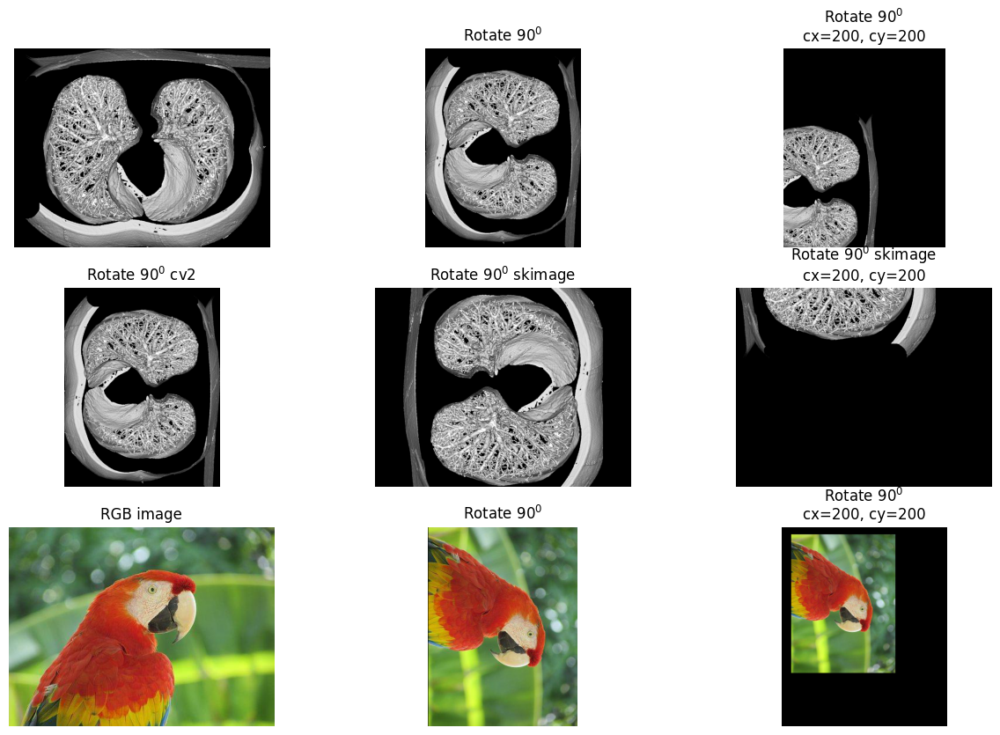

In [11]:
plt.figure(figsize=(15,10))

plt.subplot(331)
plt.imshow(lung, cmap='gray')
plt.axis('off')

plt.subplot(332)
plt.imshow(lung_rotate, cmap='gray')
plt.title(r"Rotate $90^0$")
plt.axis('off')

plt.subplot(333)
plt.imshow(lung_rotate_cx200_cy200, cmap='gray')
plt.title(r"Rotate $90^0$"+ "\ncx=200, cy=200")
plt.axis('off')

plt.subplot(334)
plt.imshow(lung_rotate_90degree_cv2, cmap='gray')
plt.title(r"Rotate $90^0$ cv2")
plt.axis('off')

plt.subplot(335)
plt.imshow(lung_rotate_skimage, cmap='gray')
plt.title(r"Rotate $90^0$ skimage")
plt.axis('off')

plt.subplot(336)
plt.imshow(lung_rotate_skimage_cx200_cy200, cmap='gray')
plt.title(r"Rotate $90^0$ skimage"+ "\ncx=200, cy=200")
plt.axis('off')

plt.subplot(337)
plt.imshow(parrot)
plt.title("RGB image")
plt.axis('off')

plt.subplot(338)
plt.imshow(parrot_rotate)
plt.title(r"Rotate $90^0$")
plt.axis('off')

plt.subplot(339)
plt.imshow(parrot_rotate_cx200_cy200)
plt.title(r"Rotate $90^0$"+ "\ncx=200, cy=200")
plt.axis('off')

## 2) Signogram Image

In [12]:
def Signogram_Image(img, degree):
    height, width = img.shape
    max_width = 0
    for i in range(degree):
        angle = np.radians(i)
        new_width = (np.abs(height*np.sin(angle)) +  np.abs(width*np.cos(angle))).astype(np.int32)
        if max_width < new_width:
            max_width = new_width
    output = np.zeros([max_width, degree], dtype=np.float32)
    for x in range(degree):
        rotate_img = Rotate_Image(img, x)
        arrays = np.sum(rotate_img, axis=0) # Sum all columns
        start_index = (max_width // 2) - ((len(arrays)) // 2)
        end_index = start_index + len(arrays)
        output[start_index:end_index,x] = arrays
    start_index_FN_x = (max_width // 2) - (height // 2)
    end_index_FN_x = start_index_FN_x + height
    output_FN = output[start_index_FN_x:end_index_FN_x, :]
    return output_FN

Text(0.5, 0, 'Degree')

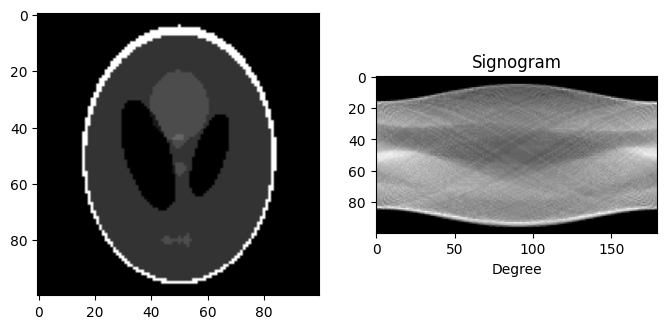

In [13]:
image = skimage.data.shepp_logan_phantom()[::4, ::4]
image_signogram = Signogram_Image(image, 180)

# Check result: https://scikit-image.org/docs/stable/auto_examples/transform/plot_radon_transform.html#sphx-glr-auto-examples-transform-plot-radon-transform-py

plt.figure(figsize=(8,6))

plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.subplot(122)
plt.imshow(image_signogram, cmap="gray")
plt.title("Signogram")
plt.xlabel("Degree")

# IV) Translate Image

In [14]:
def Translate_Image(img, tx, ty):
    height, width = img.shape
    new_height = (height + np.abs(tx)).astype(np.int32)
    new_width = (width + np.abs(tx)).astype(np.int32)
    output = np.zeros([new_height, new_width])
    for i in range(new_height):
        for j in range(new_width):
            x = (i - tx)
            y = (j - ty)
            if 0 <= x < height and 0 <= y < width:
                output[i, j] = img[x, y]
    return output

def Translate_Image_3D(img, tx, ty):
    height, width, ndim = img.shape
    output = np.zeros([height + np.abs(tx), width + np.abs(ty), ndim])
    for i in range(3):
        output[:,:,i] = Translate_Image(img[:,:,i], tx, ty)
    return output

def Translate_Image_skimage(img, tx, ty):
    height, width = img.shape[:2]
    transform = skimage.transform.SimilarityTransform(translation=(tx, ty))
    shifted = skimage.transform.warp(img, transform.inverse, output_shape=(height+np.abs(tx), width+np.abs(ty)))
    return shifted

def  Translate_Image_cv2(img, tx, ty):
    height, width = img.shape[:2]
    T = np.float32([[1, 0, tx], [0, 1, ty]])
    img_translation = cv2.warpAffine(img, T, (width+np.abs(ty), height+np.abs(tx)))
    return img_translation

In [15]:
lung_translate_tx500_ty500 = Translate_Image(lung, 500, 500)
lung_translate_tx500_ty500_cv2 = Translate_Image_cv2(lung, 500, 500)
lung_translate_tx500_ty500_skimage = Translate_Image_skimage(lung, 500, 500)

parrot_translate = Translate_Image_3D(parrot, 500, 500)

(-0.5, 952.5, 839.5, -0.5)

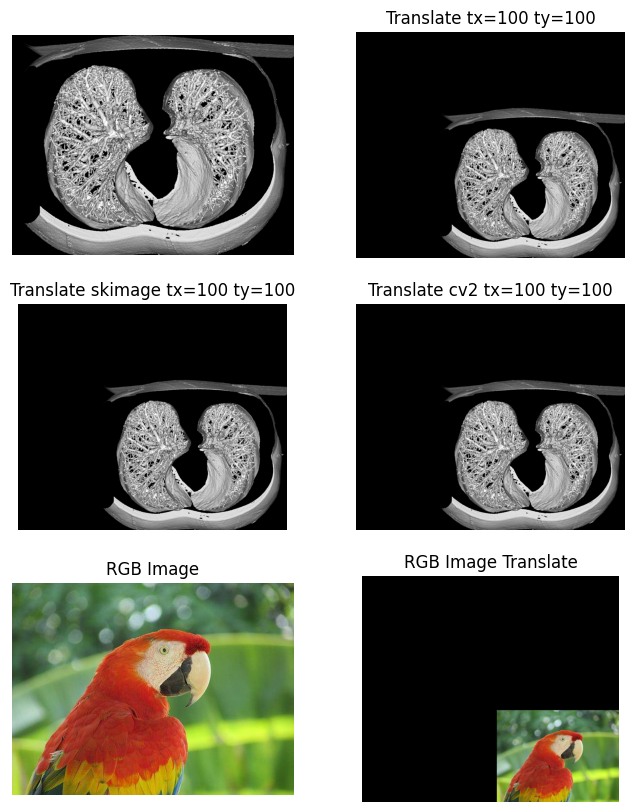

In [16]:
plt.figure(figsize=(8,10))

plt.subplot(321)
plt.imshow(lung, cmap='gray')
plt.axis('off')

plt.subplot(322)
plt.imshow(lung_translate_tx500_ty500, cmap='gray')
plt.title("Translate tx=100 ty=100")
plt.axis('off')

plt.subplot(323)
plt.imshow(lung_translate_tx500_ty500_skimage, cmap='gray')
plt.title("Translate skimage tx=100 ty=100")
plt.axis('off')

plt.subplot(324)
plt.imshow(lung_translate_tx500_ty500_cv2, cmap='gray')
plt.title("Translate cv2 tx=100 ty=100")
plt.axis('off')

plt.subplot(325)
plt.imshow(parrot)
plt.title("RGB Image")
plt.axis('off')

plt.subplot(326)
plt.imshow(parrot_translate)
plt.title("RGB Image Translate")
plt.axis('off')


# V) Scale Image

In [17]:
def Scale_Image(img, fx, fy):
    height, width = img.shape
    new_height = round(height*fx)
    new_width = round(width*fy)
    output = np.zeros([new_height, new_width])
    for i in range(new_height):
        for j in range(new_width):
            x = round(i/fx)
            y = round(j/fy)
            if 0 <= x < height and 0 <= y < width:
                output[i, j] = img[x, y]
    return output

def Scale_Image_3D(img, fx, fy):
    height, width, ndim = img.shape
    output = np.zeros([height*fx, width*fy, ndim])
    for i in range(3):
        output[:,:,i] = Scale_Image(img[:,:,i], fx, fy)
    return output

In [18]:
lung_scale = Scale_Image(lung, 2, 4)
parrot_scale = Scale_Image_3D(parrot, 2, 4)

lung_scale_cv2 = cv2.resize(lung, (0, 0), fx = 4, fy = 2)
lung_scale_skimage = skimage.transform.rescale(lung, scale=(2, 4))

Text(0.5, 1.0, 'parrot_scale')

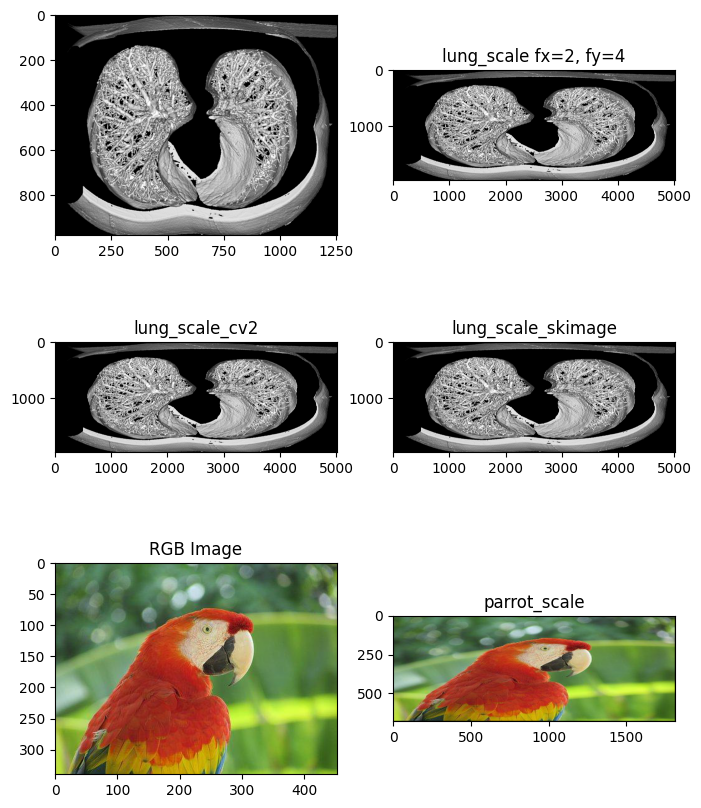

In [19]:
plt.figure(figsize=(8,10))

plt.subplot(321)
plt.imshow(lung, cmap='gray')

plt.subplot(322)
plt.imshow(lung_scale, cmap='gray')
plt.title("lung_scale fx=2, fy=4")

plt.subplot(323)
plt.imshow(lung_scale_cv2, cmap='gray')
plt.title("lung_scale_cv2")

plt.subplot(324)
plt.imshow(lung_scale_skimage, cmap='gray')
plt.title("lung_scale_skimage")

plt.subplot(325)
plt.imshow(parrot)
plt.title("RGB Image")

plt.subplot(326)
plt.imshow(parrot_scale)
plt.title("parrot_scale")

# VI) Shear Image

In [20]:
def Shear_Image(img, sv, sh):
    height, width = img.shape
    new_height = (height + np.abs(height*sv)).astype(np.int32)
    new_width = (width + np.abs(width*sh)).astype(np.int32)
    output = np.zeros([new_height, new_width])
    for i in range(new_height):
        for j in range(new_width):
            x = round(i - sv*j)
            y = round(j - sh*i)
            if 0 <= x < height and 0 <= y < width:
                output[i, j] = img[x, y]
    return output

def Shear_Image_3D(img, sv, sh):
    height, width, ndim = img.shape
    new_height = (height + np.abs(height*sv)).astype(np.int32)
    new_width = (width + np.abs(width*sh)).astype(np.int32)
    output = np.zeros([new_height, new_width, ndim])
    for i in range(3):
        output[:,:,i] = Shear_Image(img[:,:,i], sv, sh)
    return output


In [21]:
lung_shear = Shear_Image(lung, 0.5, 0.4)
parrot_shear = Shear_Image_3D(parrot, 0.5, 0.4)

Text(0.5, 1.0, 'parrot_shear sv=0.5, sh=0.4')

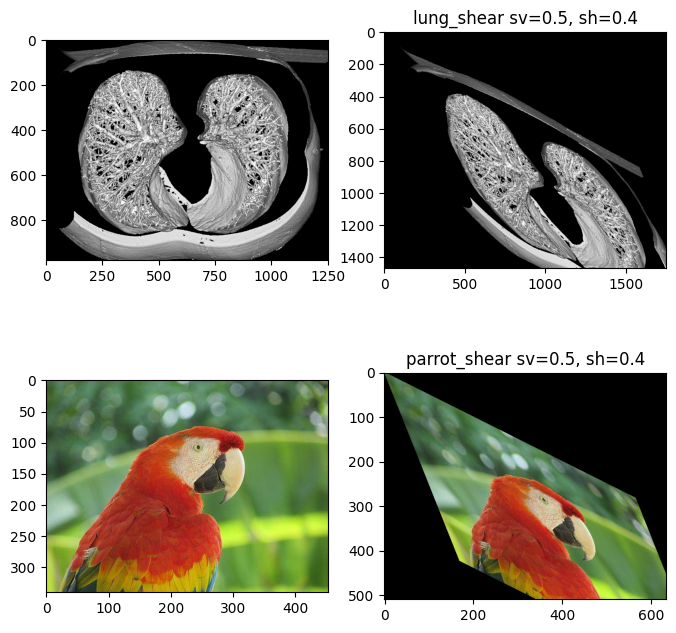

In [22]:
plt.figure(figsize=(8,8))

plt.subplot(221)
plt.imshow(lung, cmap='gray')

plt.subplot(222)
plt.imshow(lung_shear, cmap='gray')
plt.title("lung_shear sv=0.5, sh=0.4")

plt.subplot(223)
plt.imshow(parrot)

plt.subplot(224)
plt.imshow(parrot_shear, cmap='gray')
plt.title("parrot_shear sv=0.5, sh=0.4")

# VII) Subsampling

In [23]:
def Subsample(img, factor):
    return img[::factor, ::factor]

def Subsample_3D(img, factor):
    return img[::factor, ::factor, :]

In [24]:
lung_sub = Subsample(lung, 4)
parrot_sub = Subsample_3D(parrot, 4)

Text(0.5, 1.0, 'Shape=(85, 114, 3)')

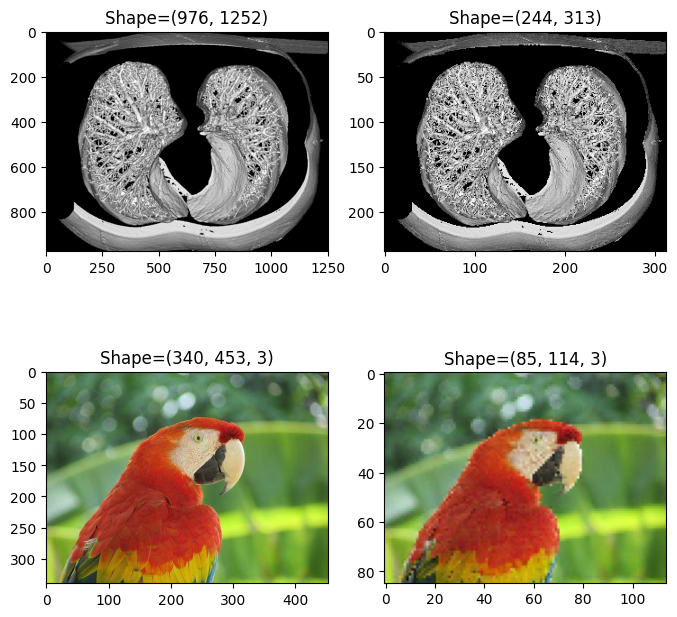

In [25]:
plt.figure(figsize=(8,8))

plt.subplot(221)
plt.imshow(lung, cmap='gray')
plt.title("Shape={}".format(lung.shape))

plt.subplot(222)
plt.imshow(lung_sub, cmap='gray')
plt.title("Shape={}".format(lung_sub.shape))

plt.subplot(223)
plt.imshow(parrot)
plt.title("Shape={}".format(parrot.shape))

plt.subplot(224)
plt.imshow(parrot_sub, cmap='gray')
plt.title("Shape={}".format(parrot_sub.shape))


# VII) Zero Padding 

In [26]:
def Zero_Padding(img, nx, ny):
    m, n = img.shape
    mnew = m + 2*nx
    nnew = n + 2*ny
    output = np.zeros([mnew, nnew])
    for i in range(nx, mnew-nx):
        for j in range(ny, nnew-ny):
            output[i][j] = img[i-nx][j-ny]
    return output

def Zero_Padding_v2(img, nx, ny):
    height, width = img.shape
    height_new = height + 2*nx
    width_new = width + 2*ny
    output = np.zeros([height_new, width_new])
    output[nx:height_new-nx, ny:width_new-ny] = img
    return output

def Zero_Padding_3D(img, nx, ny):
    height, width, ndim = img.shape
    height_new = height + 2*nx
    width_new = width + 2*ny
    output = np.zeros([height_new, width_new, ndim])
    output[nx:height_new-nx, ny:width_new-ny, :] = img
    return output

In [27]:
cameraman_padding_zero = Zero_Padding(cameraman, 50, 50)
cameraman_padding_zero_v2 = Zero_Padding_v2(cameraman, 50, 50)
parrot_padding_zero = Zero_Padding_3D(parrot, 50, 50)

(-0.5, 552.5, 439.5, -0.5)

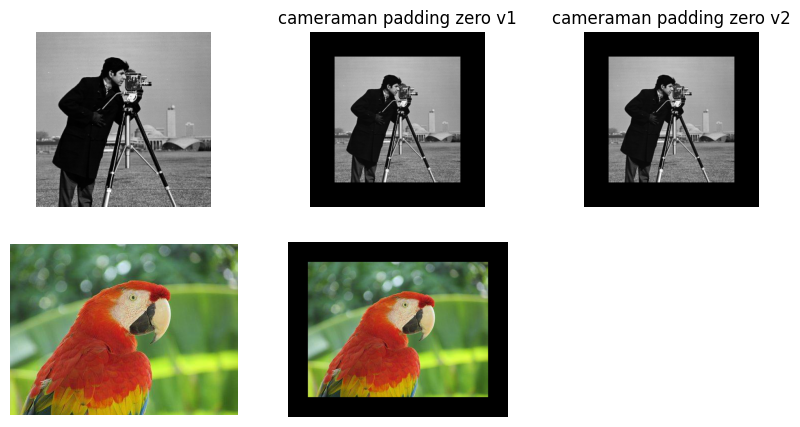

In [28]:
plt.figure(figsize=(10,5))

plt.subplot(231)
plt.imshow(cameraman, cmap='gray')
plt.axis('off')

plt.subplot(232)
plt.imshow(cameraman_padding_zero, cmap='gray')
plt.title("cameraman padding zero v1")
plt.axis('off')

plt.subplot(233)
plt.imshow(cameraman_padding_zero_v2, cmap='gray')
plt.title("cameraman padding zero v2")
plt.axis('off')

plt.subplot(234)
plt.imshow(parrot)
plt.axis('off')

plt.subplot(235)
plt.imshow(parrot_padding_zero)
plt.axis('off')

# VIII) Mirror Padding

In [33]:
def Mirror_Padding(img, nx, ny):
    height, width = img.shape
    height_new = height + 2*nx
    width_new = width + 2*ny
    output = np.zeros([height_new, width_new])
    # Top and Bottom
    for x in range(nx):
        for y in range(width):
            output[x, y+ny] = img[nx-x, y] # Top 
            output[x+height_new-nx, y+ny] = img[height-x-1, y] # Bottom
    # Center 
    for x in range(height):
        for y in range(width):
            output[nx + x, ny + y] = img[x, y] # Add img to center output
    # Left and Right
    for x in range(height_new):
        for y in range(ny):
            output[x, ny-y] = output[x, ny+y] # Left
            output[x, width_new-ny+y] = output[x, width_new-ny-y-1] # Right
    return output

def Mirror_Padding_v2(img, nx, ny):
    height, width = img.shape
    height_new = height + 2*nx
    width_new = width + 2*ny
    output = np.zeros([height_new, width_new])
    # Center
    output[nx:height_new-nx, ny:width_new-ny] = img
    # Top and Bottom
    output[:nx, ny:width_new-ny] = img[nx-1::-1, :] # Top
    output[height+nx:, ny:width_new-ny] = img[height-1:height-nx-1:-1, :] # Bottom
    # Left and Right
    output[:height_new, :ny] = output[:, 2*ny:ny:-1] # Left
    output[:height_new, width_new-ny:width_new] = output[:, width_new-ny-1:width_new-2*ny-1:-1] # Right
    return output

def Mirror_Padding_3D(img, nx, ny):
    height, width, ndim = img.shape
    height_new = height + 2*nx
    width_new = width + 2*ny
    output = np.zeros([height_new, width_new, ndim])
    # Center
    output[nx:height_new-nx, ny:width_new-ny, :] = img
    # Top and Bottom
    output[:nx, ny:width_new-ny, :] = img[nx-1::-1, :, :] # Top
    output[height+nx:, ny:width_new-ny, :] = img[height-1:height-nx-1:-1, :, :] # Bottom
    # Left and Right
    output[:height_new, :ny, :] = output[:, 2*ny:ny:-1, :] # Left
    output[:height_new, width_new-ny:width_new, :] = output[:, width_new-ny-1:width_new-2*ny-1:-1, :] # Right
    return output

def Mirror_Padding_3D_V2(img, nx, ny):
    height, width, ndim = img.shape
    height_new = height + 2*nx
    width_new = width + 2*ny
    output = np.zeros([height_new, width_new, ndim])
    for i in range(3):
        output[:,:,i] = Mirror_Padding_v2(img[:,:,i], nx, ny)
    return output

In [34]:
cameraman_padding_mirror = Mirror_Padding(cameraman, 100, 100)
cameraman_padding_mirror_v2 = Mirror_Padding_v2(cameraman, 100, 100)
parrot_padding_mirror = Mirror_Padding_3D(parrot, 100, 100)
parrot_padding_mirror_2 = Mirror_Padding_3D_V2(parrot, 100, 100)

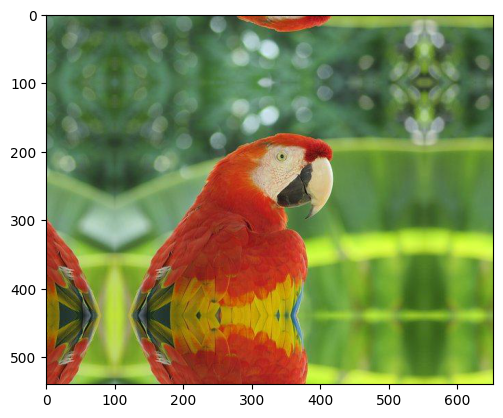

In [35]:
plt.imshow(parrot_padding_mirror_2)

(-0.5, 652.5, 539.5, -0.5)

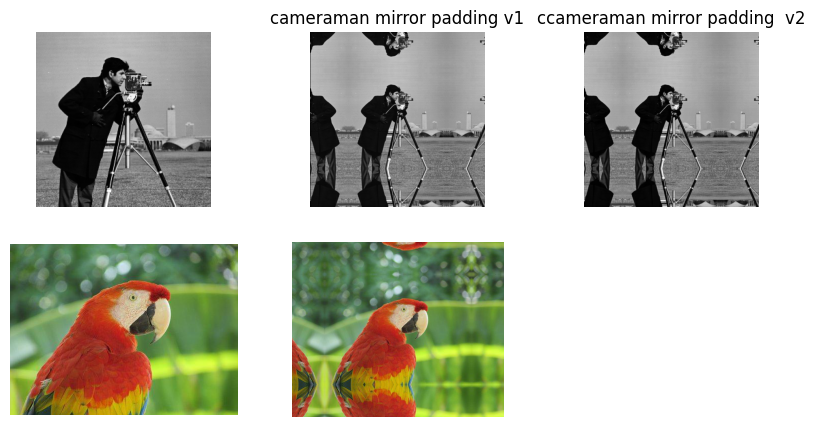

In [ ]:
plt.figure(figsize=(10,5))

plt.subplot(231)
plt.imshow(cameraman, cmap='gray')
plt.axis('off')

plt.subplot(232)
plt.imshow(cameraman_padding_mirror, cmap='gray')
plt.title("cameraman mirror padding v1")
plt.axis('off')

plt.subplot(233)
plt.imshow(cameraman_padding_mirror_v2, cmap='gray')
plt.title("ccameraman mirror padding  v2")
plt.axis('off')

plt.subplot(234)
plt.imshow(parrot)
plt.axis('off')

plt.subplot(235)
plt.imshow(parrot_padding_mirror)
plt.axis('off')

# IX) Histogram

In [ ]:
def Hist_image(img):
    h = [(img==v).sum() for v in range(256)]
    hist = np.array(h) # Histogram
    norm = hist/hist.sum() # Normalized histogram
    return hist, norm

def cdf_img(img):
    cdf = np.zeros((256, ))
    _, norm = Hist_image(img)
    for i in range(256):
        cdf[i] = norm[i] + cdf[i-1]
    return cdf

def Hist_cdf_img_3D(img):
    hist_store = []
    norm_store = []
    cdf_strore = []
    for i in range(3):
        hist_value, norm_value = Hist_image(img[:,:,i].astype(np.float32))
        cdf_value = cdf_img(img[:,:,i].astype(np.float32))
        hist_store.append(hist_value)
        norm_store.append(norm_value)
        cdf_strore.append(cdf_value)
    return np.array(hist_store), np.array(norm_store), np.array(cdf_strore)

In [ ]:
hist_cameraman, norm_cameraman = Hist_image(cameraman)
cdf_cameraman = cdf_img(cameraman)

hist_parrot, norm_parrot, cdf_parrot = Hist_cdf_img_3D(parrot)

(-0.5, 452.5, 339.5, -0.5)

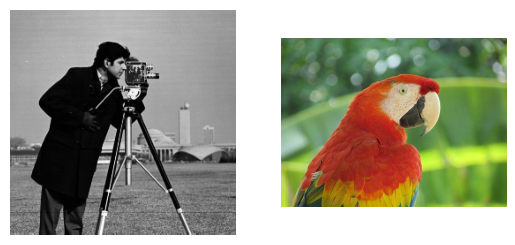

In [ ]:
plt.subplot(121)
plt.imshow(cameraman, cmap='gray')
plt.axis('off')

plt.subplot(122)
plt.imshow(parrot)
plt.axis('off')

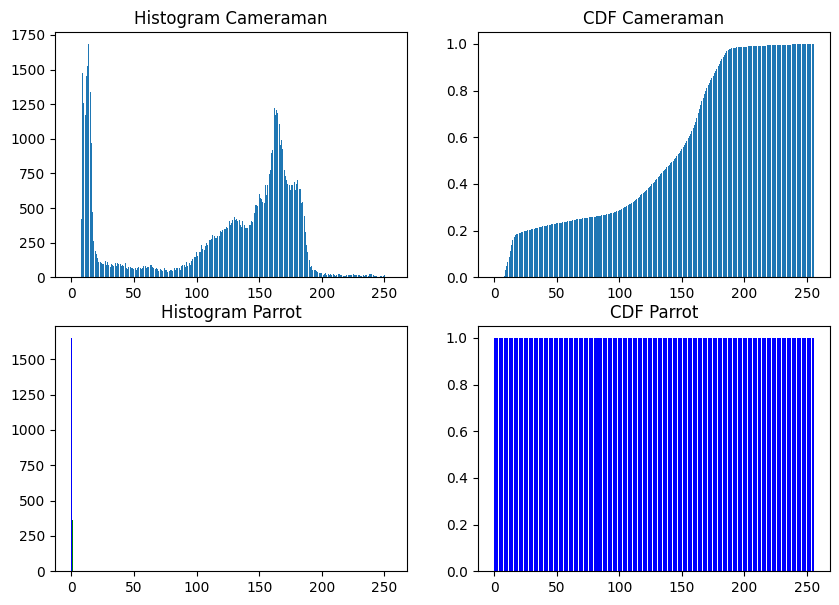

In [ ]:
plt.figure(figsize=(10,7))

plt.subplot(221)
plt.bar(np.arange(256), hist_cameraman)
plt.title("Histogram Cameraman")

plt.subplot(222)
plt.bar(np.arange(256), cdf_cameraman)
plt.title("CDF Cameraman")

color = ["red", "green", "blue"]

plt.subplot(223)
for i in range(3):
    plt.bar(np.arange(256), hist_parrot[i], color=color[i])
plt.title("Histogram Parrot")

plt.subplot(224)
for i in range(3):
    plt.bar(np.arange(256), cdf_parrot[i], color=color[i])
plt.title("CDF Parrot")

plt.show()

# X) Bit Plane

In [ ]:
# Hàm chuyển từ số từ cơ số 10 sang cơ số nhị phân
def cov_binary(num):
    num_int = int(num.round())
    binary_num = [int(i) for i in list("{0:b}".format(num_int))]
    for j in range(8 - len(binary_num)):
        binary_num.insert(0, 0)
    return binary_num

# Hàm chuyển từ nhị phân sang cơ số 10
def conv_decimal(listt):
    x = 0
    for i in range(8):
        x = x + int(listt[i])*(2**(7-i))
    return x

# Hàm tách theo từng lớp bit khác nhau
def discriminate_bit(bit, img):
    m, n = img.shape
    z = np.zeros([m, n])
    for i in range(m):
        for j in range(n):
            x = cov_binary(img[i][j])
            for k in range(8):
                if k == bit:
                    x[k] = x[k]
                else:
                    x[k] = 0
            x1 = conv_decimal(x)
            z[i][j] = x1
    return z

def discriminate_bit_3D(bit, img):
    height, width, ndim = img.shape
    output = np.zeros([height, width, ndim], dtype=img.dtype)
    for i in range(3):
        output[:,:,i] = discriminate_bit(bit, img[:,:,i])
    return output

In [ ]:
array_img = []
for i in range(8):
    array_img.append(discriminate_bit(i, dolar))

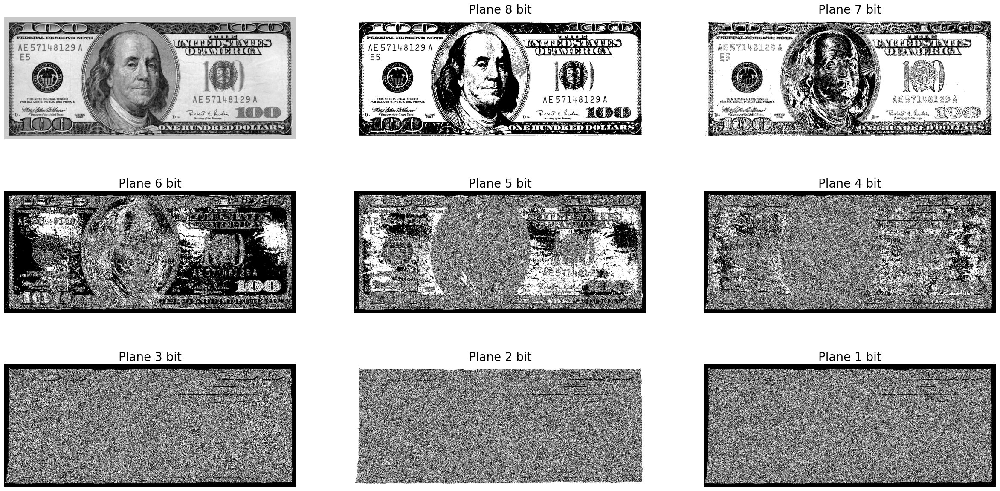

In [ ]:
plt.figure(figsize=(30, 15))
plt.subplot(3,3,1)
plt.imshow(dolar, cmap='gray')
plt.axis('off')
for i in range(8):
    bit = np.round(np.log2(np.max(array_img[i]))) + 1
    bit_plane = "Plane {:.0f} bit".format(bit)
    plt.subplot(3,3,i+2)
    plt.imshow(array_img[i], cmap='gray')
    plt.title(bit_plane, fontsize=20)
    plt.axis('off')

In [ ]:
array_img_3D = np.empty((0, flower.shape[0], flower.shape[1], 3))

for i in range(5):
    temp_img = discriminate_bit_3D(i, flower)
    temp_img = np.array(temp_img)
    array_img_3D = np.vstack((array_img_3D, temp_img[np.newaxis, :]))

array_img_3D = np.array(array_img_3D)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


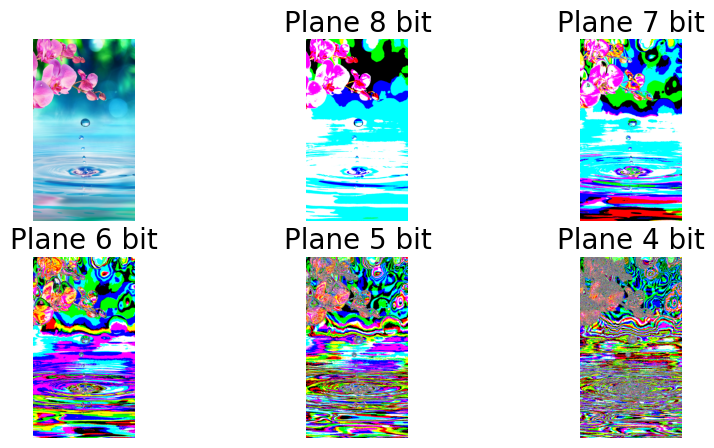

In [ ]:
plt.figure(figsize=(10, 8))
plt.subplot(3,3,1)
plt.imshow(flower, vmin=0, vmax=255)
plt.axis('off')
for i in range(5):
    bit = np.round(np.log2(np.max(array_img[i]))) + 1
    bit_plane = "Plane {:.0f} bit".format(bit)
    plt.subplot(3,3,i+2)
    plt.imshow(array_img_3D[i], vmin=0, vmax=255)
    plt.title(bit_plane, fontsize=20)
    plt.axis('off')

# XI) PyDicom

In [ ]:
listfile = pydicom.data.get_testdata_files()
listdcm = []
for i in listfile:
    if i.endswith(".dcm") == True:
        istart = i.find("/test_files/")+len("/test_files/")
        listdcm.append(i[istart:])
print("Number of dicom files:", len(listdcm))
print("Dicom files:", np.array(listdcm).T)

Number of dicom files: 70
Dicom files: ['SC_rgb_small_odd_big_endian.dcm' 'no_meta.dcm' 'SC_rgb_jpeg_dcmtk.dcm'
 'SC_rgb_rle_2frame.dcm' 'reportsi_with_empty_number_tags.dcm'
 'rtstruct.dcm' 'MR_small_RLE.dcm' 'rtdose_1frame.dcm'
 'SC_ybr_full_422_uncompressed.dcm' 'GDCMJ2K_TextGBR.dcm' 'JPEG-lossy.dcm'
 'MR_small.dcm' 'rtdose_expb_1frame.dcm' 'ExplVR_BigEnd.dcm'
 'SC_rgb_dcmtk_+eb+cy+s2.dcm' 'no_meta_group_length.dcm'
 'SC_rgb_jpeg_lossy_gdcm.dcm' 'SC_rgb_rle_16bit.dcm'
 'ExplVR_LitEndNoMeta.dcm' 'liver_1frame.dcm'
 'JPEG2000-embedded-sequence-delimiter.dcm'
 'MR_small_jpeg_ls_lossless.dcm' 'UN_sequence.dcm' 'JPEG2000.dcm'
 'rtdose_expb.dcm' 'J2K_pixelrep_mismatch.dcm' '693_J2KI.dcm'
 'SC_jpeg_no_color_transform_2.dcm' 'rtdose.dcm' 'SC_rgb_gdcm_KY.dcm'
 'rtplan.dcm' 'SC_rgb_rle_16bit_2frame.dcm' 'SC_rgb_small_odd.dcm'
 'MR_truncated.dcm' 'ExplVR_BigEndNoMeta.dcm' 'meta_missing_tsyntax.dcm'
 'SC_rgb_jpeg_app14_dcmd.dcm' 'MR_small_implicit.dcm' 'nested_priv_SQ.dcm'
 'badVR.dcm' 'MR_smal

In [ ]:
filename = pydicom.data.get_testdata_file("MR_small.dcm")
ds = pydicom.dcmread(filename)
print(ds)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 190
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: MR Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.6.1.4.1.5962.1.1.4.1.1.20040826185059.5457
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.3.6.1.4.1.5962.2
(0002, 0013) Implementation Version Name         SH: 'DCTOOL100'
(0002, 0016) Source Application Entity Title     AE: 'CLUNIE1'
-------------------------------------------------
(0008, 0008) Image Type                          CS: ['DERIVED', 'SECONDARY', 'OTHER']
(0008, 0012) Instance Creation Date              DA: '20040826'
(0008, 0013) Instance Creation Time              TM: '185434'
(0008, 0014) Instance Creator UID                UI: 1.3.6.1.4.1.5962.3
(0008, 0016) SOP Class UID                  

(64, 64)


(array([1., 0., 0., ..., 0., 0., 1.]),
 array([ 127.        ,  127.94079254,  128.88158508, ..., 2143.11841492,
        2144.05920746, 2145.        ]),
 <BarContainer object of 2145 artists>)

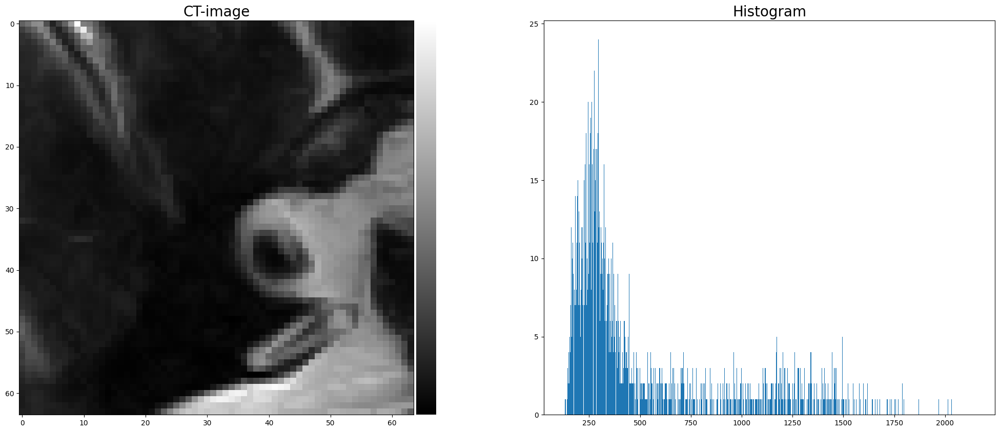

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

arr = ds.pixel_array
print(arr.shape)

plt.figure(figsize=(25, 10))

plt.subplot(121)
plt.title("CT-image", fontsize=20)
ax = plt.gca()
im = ax.imshow(arr, cmap='gray')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax)
plt.axis('off')

plt.subplot(122)
plt.title("Histogram", fontsize=20)
plt.hist(arr.ravel(), np.max(arr))